# Lab | Matplotlib & Seaborn

#### Import all the necessary libraries here:

In [173]:
# Libraries
import numpy as np
from sklearn import datasets
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sqlalchemy import create_engine
import os

## Challenge 1

#### The data we will use in this challenge is:

In [16]:
x = np.arange(0,100)
y = x*2
z = x**2

#### Plot (x, y) and (x, z).
There are 2 ways of doing this. Do in both ways.

**Hint**: Check out the nrows, ncols and index arguments of subplots. 

Also, play around with the linewidth and style. Use the ones you're most happy with.

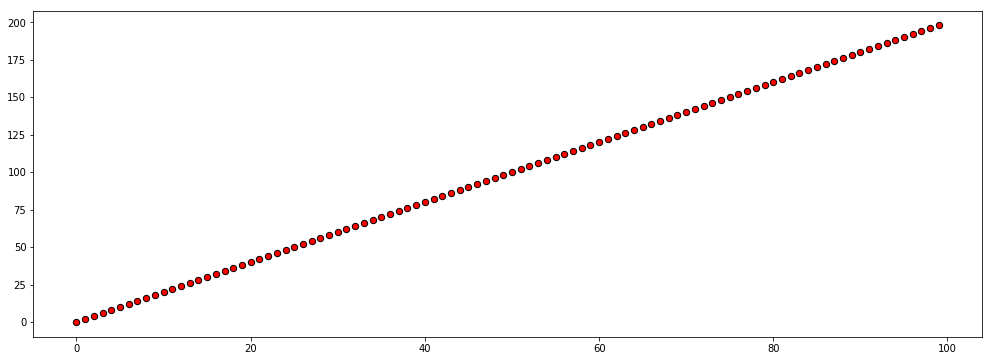

In [39]:
# Method 1
plt.figure(figsize=(17,6))
plt.scatter(x,y,label='x',linewidth=1,s=40,color='red',edgecolor='black')


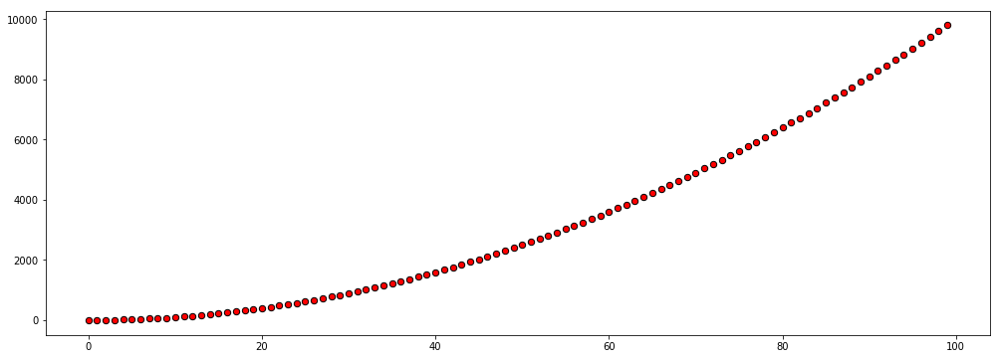

In [27]:
plt.figure(figsize=(17,6))
plt.scatter(x,z,label='x',s=40,color='red',edgecolor='black')

#### Use plt.subplots(nrows=1, ncols=2) to create the plot.

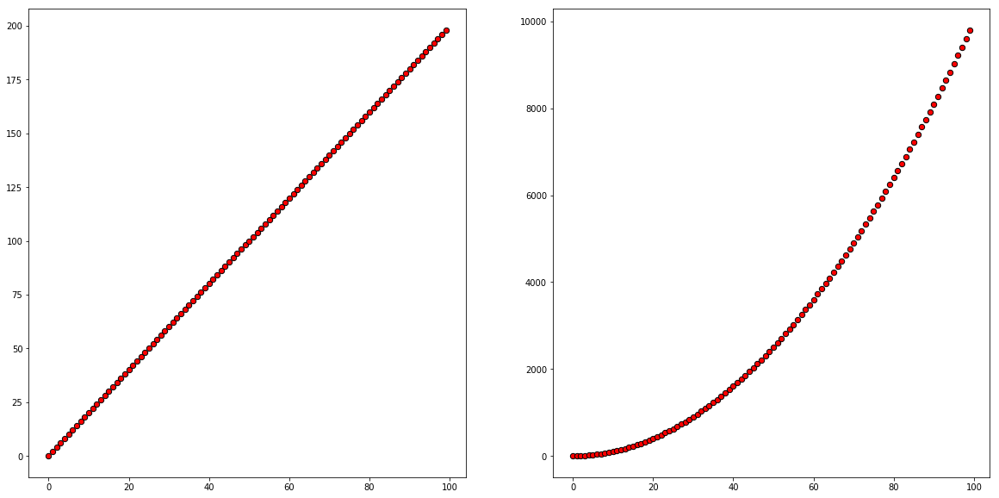

In [35]:
# Method 2
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].scatter(x,y,label='x',s=40,color='red',edgecolor='black')
ax[1].scatter(x,z,label='x',s=40,color='red',edgecolor='black')

#### Use your previous code but now, resize your plot.
**Hint**: Add the figsize argument in plt.subplots().

If you want, try to add a title to the plot or even axes labels. You can also play with the fontweight and fontsize of the titles and labels. 

Text(0, 0.5, 'y')

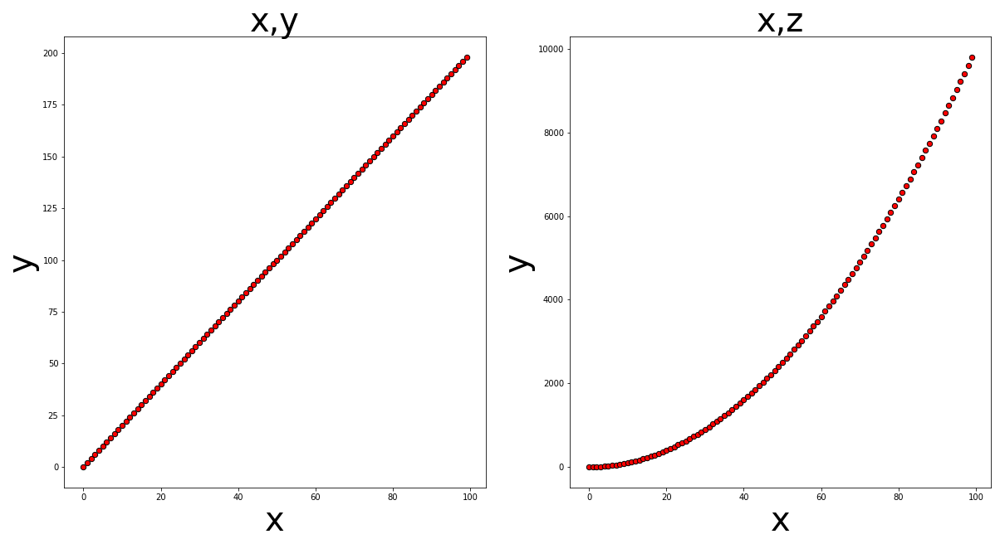

In [49]:
# your code here
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].scatter(x,y,label='x',s=40,color='red',edgecolor='black')
ax[0].set_title('x,y', fontsize=40)
ax[1].scatter(x,z,label='x',s=40,color='red',edgecolor='black')
ax[1].set_title('x,z', fontsize=40)
ax[1].set_xlabel('x', fontsize=40)
ax[1].set_ylabel('y', fontsize=40)
ax[0].set_xlabel('x', fontsize=40)
ax[0].set_ylabel('y', fontsize=40)


#### Now you will have to plot both $y=x^2$ and $y=e^x$ in the same plot. Create two subplots and use a normal scale in the first one and a logarithmic scale in the second one.
**Hint**: Use `set_xscale` and `set_yscale`.

In [57]:
from math import e


In [59]:
y=x**2
z=e**x


Text(0, 0.5, 'y')

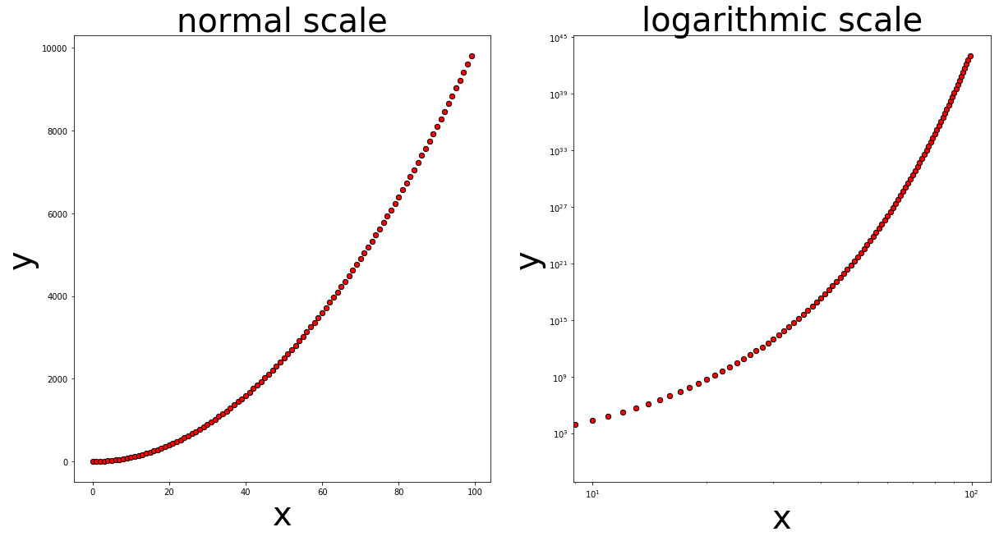

In [66]:
# your code here
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].scatter(x,y,label='x',s=40,color='red',edgecolor='black')
ax[0].set_title('normal scale', fontsize=40)
ax[1].scatter(x,z,label='x',s=40,color='red',edgecolor='black')
ax[1].set_title('logarithmic scale', fontsize=40)
ax[1].set_xlabel('x', fontsize=40)
ax[1].set_ylabel('y', fontsize=40)
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_ylabel('y', fontsize=40)
ax[0].set_xlabel('x', fontsize=40)
ax[0].set_ylabel('y', fontsize=40)

#### As a bonus challenge, try to add a legend to the plot.

In [ ]:
# your code here

## Challenge 2
#### Import the `Fitbit2` dataset and store it in a variable called `fitbit`. You can find the dataset in Ironhack's database:
* db: `fitbit`
* table: `fitbit2`

In [74]:
# your code here
driver   = 'mysql+pymysql:'
user     = 'root'
password = 'Ironhack12'
ip       = '127.0.0.1'
database = 'fitbit'
connection_string = f'{driver}//{user}:{password}@{ip}/{database}'
engine = create_engine(connection_string)

In [201]:
fitbit=pd.read_sql('SELECT* FROM fitbit2',engine)
fitbit2=fitbit

#### From the Fitbit data, we want to visually understand:

How the average number of steps change by month. Use the appropriate visualization to show the median steps by month. Is Fitbitter more active on weekend or workdays? All plots must be in the same jupyter notebook cell.

**Hints**:

* Use Months_encoded and Week_or Weekend columns.
* Use matplolib.pyplot object oriented API.
* Set your size figure to 12,4
* Explore plt.sca
* Explore plt.xticks
* Save your figures in a folder called `figures` in your repo. 

In [175]:
os.mkdir('figures')

In [133]:
fitbit2.dtypes

Date                          object
Calorie burned                 int64
Steps                          int64
Distance                      object
Floors                         int64
Minutes Sedentary             object
Minutes Lightly Active         int64
Minutes Fairly Active          int64
Minutes Very Active            int64
Activity Calories              int64
MinutesOfSleep                 int64
MinutesOfBeingAwake            int64
NumberOfAwakings               int64
LengthOfRestInMinutes          int64
Distance_miles                object
Days                          object
Days_encoded                   int64
Work_or_Weekend               object
Hours Sleep                   object
Sleep efficiency              object
Yesterday_sleep               object
Yesterday_sleep_efficiency    object
Months                        object
Months_encoded                object
dtype: object

In [131]:
fitbit2=fitbit2.astype({'Work_or_Weekend':'object'})

In [191]:
x=fitbit2['Months_encoded'].sort_values().unique()
y=months_median['Steps']

([<matplotlib.axis.XTick at 0x1a31bf5588>,
 <a list of 2 Text xticklabel objects>)

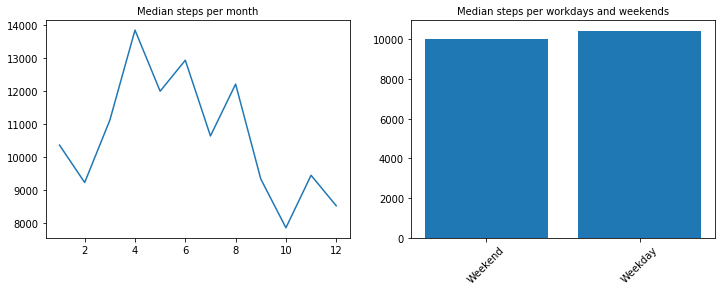

In [202]:
x_m = sorted(fitbit['Months_encoded'].unique())
y_m= fitbit.groupby(by="Months_encoded")['Steps'].median()
# by week
x_w = sorted(fitbit['Work_or_Weekend'].unique())
y_w = fitbit.groupby(by="Work_or_Weekend")['Steps'].median()
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
plt.sca(ax1)
plt.plot(x_m, y_m)
plt.title('Median steps per month', fontsize=10)
plt.sca(ax2)
plt.bar(x_w, y_w)
plt.title('Median steps per workdays and weekends', fontsize=10)
plt.xticks((0,1), ("Weekend", "Weekday"), rotation=45)

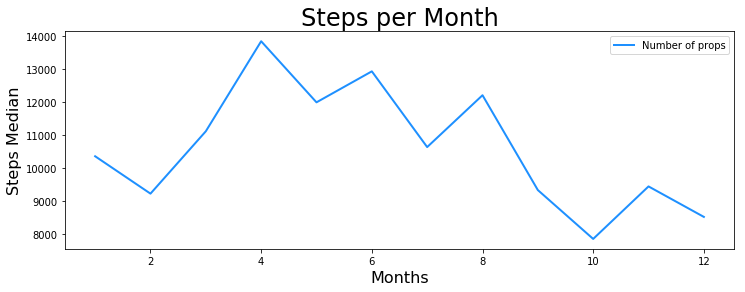

<Figure size 432x288 with 0 Axes>

In [203]:

plt.figure(figsize=(12,4))
x=fitbit2['Months_encoded'].sort_values().unique()
months_median=fitbit2.groupby('Months_encoded').agg({'Steps':'median'})
y=months_median['Steps']
plt.plot(x,y,'dodgerblue',label='Number of props', linewidth=2)
plt.title('Steps per Month', fontsize=24)
plt.xlabel('Months',fontsize=16)
plt.ylabel('Steps Median', fontsize=16)
plt.legend()
plt.show()
plt.savefig('figures/months_median_Steps.png', dpi=400,quality=100)
plt.clf()


In [134]:
week_weekend_median

,Steps
Work_or_Weekend,
0,9998.0
1,10445.5


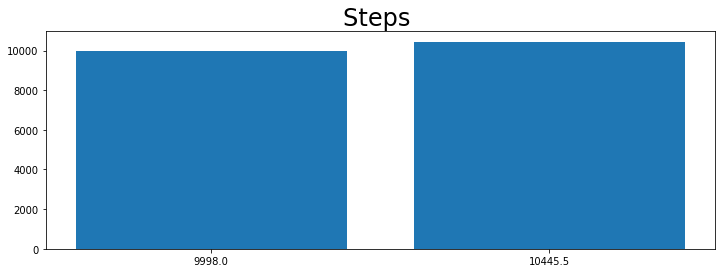

<Figure size 432x288 with 0 Axes>

In [204]:
week_weekend_median=fitbit2.groupby('Work_or_Weekend').agg({'Steps':'median'})
y_pos = np.arange(len(week_weekend_median))

plt.figure(figsize=(12,4))
plt.bar(y_pos, week_weekend_median['Steps'])
plt.title('Steps ', fontsize=24)
plt.xticks(y_pos, week_weekend_median['Steps'])
plt.show()
plt.clf()



In [88]:
fitbit2

,Date,Calorie burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories,...,Distance_miles,Days,Days_encoded,Work_or_Weekend,Hours Sleep,Sleep efficiency,Yesterday_sleep,Yesterday_sleep_efficiency,Months,Months_encoded
0,2015-05-08,1934,905,0.65,0,1.355,46,0,0,1680,...,0.40389115,Friday,4,1,6.4,92.0863309353,0,0,May,5
1,2015-05-09,3631,18925,14.11,4,611,316,61,60,2248,...,8.76754481,Saturday,5,0,7.56666666667,92.4643584521,6.4,92.0863309353,May,5
2,2015-05-10,3204,14228,10.57,1,602,226,14,77,1719,...,6.56789147,Sunday,6,0,6.45,88.7614678899,7.56666666667,92.4643584521,May,5
3,2015-05-11,2673,6756,5.02,8,749,190,23,4,9620,...,3.11928242,Monday,0,1,5.18333333333,88.8571428571,6.45,88.7614678899,May,5
4,2015-05-12,2495,502,3.73,1,876,171,0,0,7360,...,2.31771383,Tuesday,1,1,6.78333333333,82.8920570265,5.18333333333,88.8571428571,May,5
5,2015-05-13,276,779,5.79,15,726,172,34,18,1094,...,3.59773809,Wednesday,2,1,6.75,88.6214442013,6.78333333333,82.8920570265,May,5
6,2015-05-14,2687,5614,4.17,2,782,216,13,1,9830,...,2.59111707,Thursday,3,1,6.35,91.8072289157,6.75,88.6214442013,May,5
7,2015-05-15,2793,8169,6.07,14,801,218,8,7,1092,...,3.77172197,Friday,4,1,4.48333333333,87.908496732,6.35,91.8072289157,May,5
8,2015-05-16,4061,19971,14.84,18,532,247,101,118,27,...,9.22114564,Saturday,5,0,7.53333333333,89.1518737673,4.48333333333,87.908496732,May,5
9,2015-05-17,3349,852,6.33,12,606,186,46,73,1766,...,3.93327843,Sunday,6,0,4.48333333333,92.439862543,7.53333333333,89.1518737673,May,5


In [205]:
fitbit2['Minutes Sedentary']=fitbit2['Minutes Sedentary'].apply(lambda x: x.replace(".",""))

In [206]:
fitbit2=fitbit2.astype({'Minutes Sedentary':'int64'})

#### Write a loop to plot 3 scatter plots of the following features:

* Minutes Lightly Active vs Steps    
* Minutes Very Active vs Steps    
* Minutes Sedentary vs Steps  

In [207]:
loop_list=['Minutes Lightly Active','Minutes Very Active','Minutes Sedentary']

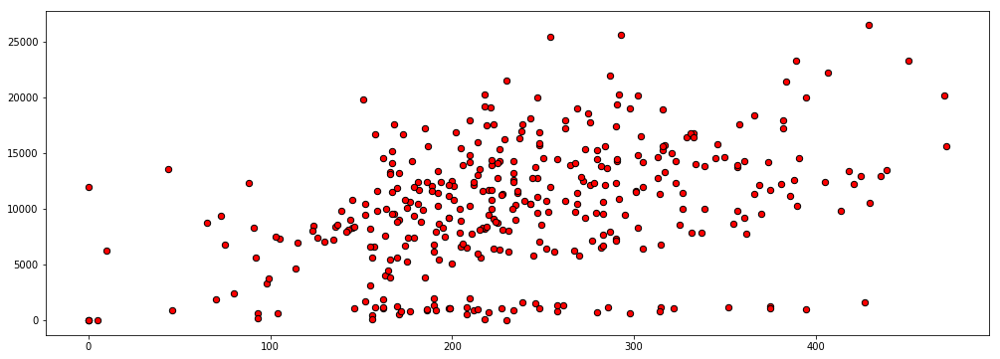

<Figure size 432x288 with 0 Axes>

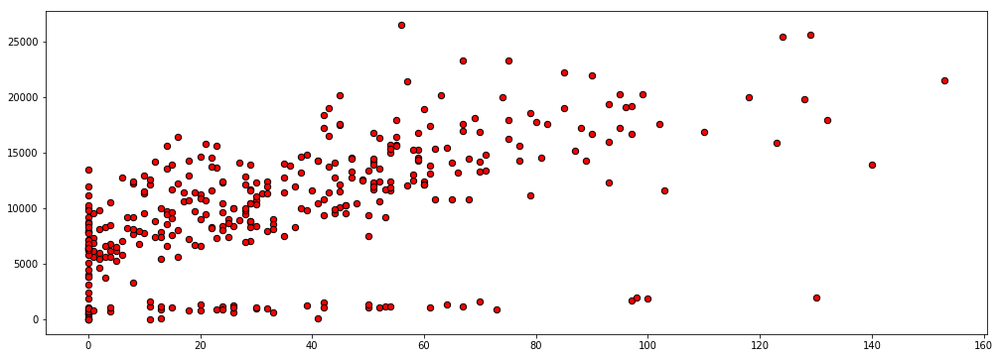

<Figure size 432x288 with 0 Axes>

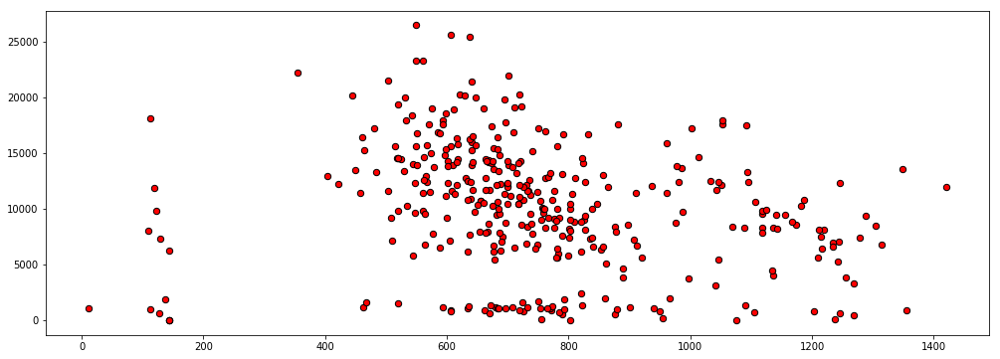

<Figure size 432x288 with 0 Axes>

In [208]:
# your code here
for i in loop_list:
    x=fitbit2[i]
    y=fitbit2['Steps']
    plt.figure(figsize=(17,6))
    plt.scatter(x,y,label='x',linewidth=1,s=40,color='red',edgecolor='black')
    plt.show()
    plt.savefig(f'figures/{i}_Steps.png', dpi=400,quality=100)
    plt.clf()

## Challenge 3

#### Import the `titanic` dataset and store it in a variable called `titanic`. You can find the dataset in Ironhack's database:
* db: `titanic`
* table: `titanic`

In [209]:
# your code here
driver   = 'mysql+pymysql:'
user     = 'root'
password = 'Ironhack12'
ip       = '127.0.0.1'
database = 'titanicb'
connection_string = f'{driver}//{user}:{password}@{ip}/{database}'
engine = create_engine(connection_string)

In [212]:
titanic=pd.read_sql('SELECT * FROM titanic',engine)

In [230]:
titanic.shape

(1309, 12)

In [347]:
titanic

,PassengerId,Survived,Pclass,Name,Gender,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0.0,3,"Braund, Mr. Owen Harris",male,22,1,0,A/5 21171,7.2500,U0,S
1,2,1.0,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38,1,0,PC 17599,71.2833,C85,C
2,3,1.0,3,"Heikkinen, Miss. Laina",female,26,0,0,STON/O2. 3101282,7.9250,U0,S
3,4,1.0,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35,1,0,113803,53.1000,C123,S
4,5,0.0,3,"Allen, Mr. William Henry",male,35,0,0,373450,8.0500,U0,S
5,6,0.0,3,"Moran, Mr. James",male,23,0,0,330877,8.4583,U0,Q
6,7,0.0,1,"McCarthy, Mr. Timothy J",male,54,0,0,17463,51.8625,E46,S
7,8,0.0,3,"Palsson, Master. Gosta Leonard",male,2,3,1,349909,21.0750,U0,S
8,9,1.0,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27,0,2,347742,11.1333,U0,S
9,10,1.0,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14,1,0,237736,30.0708,U0,C


#### Explore the titanic dataset using Pandas dtypes.

In [234]:
# your code here
titanic.dtypes

PassengerId      int64
Survived       float64
Pclass           int64
Name            object
Gender          object
Age              int64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

#### What are your numerical variables? What are your categorical variables?
**Hint**: Use Pandas select_dtypes.

In [218]:
# NUMERICAL VARIABLES
# your code here
titanic.select_dtypes('int64', 'float64').head()

,PassengerId,Pclass,SibSp,Parch
0,1,3,1,0
1,2,1,1,0
2,3,3,0,0
3,4,1,1,0
4,5,3,0,0


In [219]:
# CATEGORICAL VARIABLES
# your code here
titanic.select_dtypes('object').head()

,Name,Gender,Ticket,Cabin,Embarked
0,"Braund, Mr. Owen Harris",male,A/5 21171,U0,S
1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,PC 17599,C85,C
2,"Heikkinen, Miss. Laina",female,STON/O2. 3101282,U0,S
3,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,113803,C123,S
4,"Allen, Mr. William Henry",male,373450,U0,S


#### Set the plot style to classic and the figure size to (12,6).
**Hint**: To set the style you can use matplotlib or seaborn functions. Do some research on the matter.

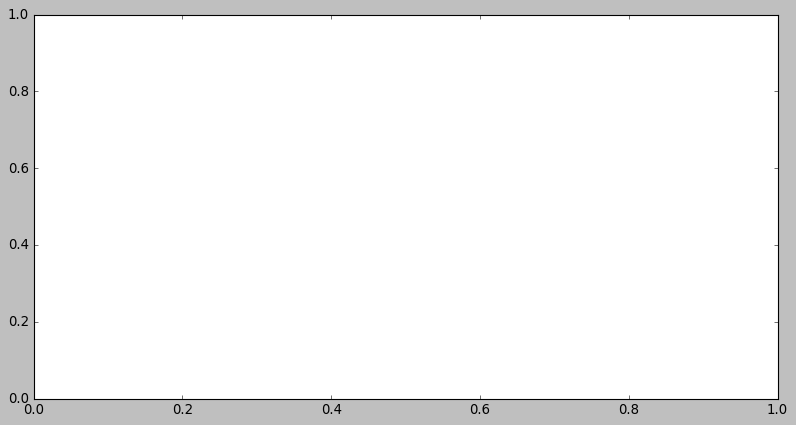

In [228]:
fig, ax = plt.subplots(figsize=(12,6))
plt.style.use('classic')

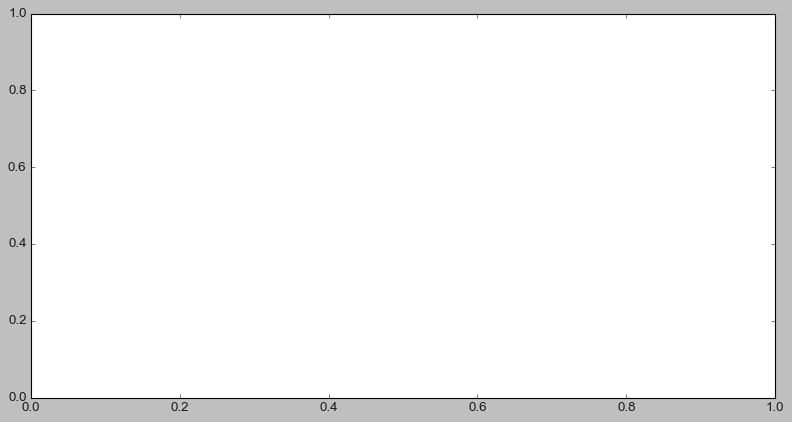

In [229]:
# your code here
fig, ax = plt.subplots(figsize=(12,6))
sns.set()

#### Use the right visulalization to show the distribution of column `Age`.

In [250]:
ages=titanic['Age'].sort_values().unique()
ages_count=titanic.groupby('Age')['PassengerId'].count()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       70, 71, 74, 76, 80])

Text(0.5, 0, 'Age')

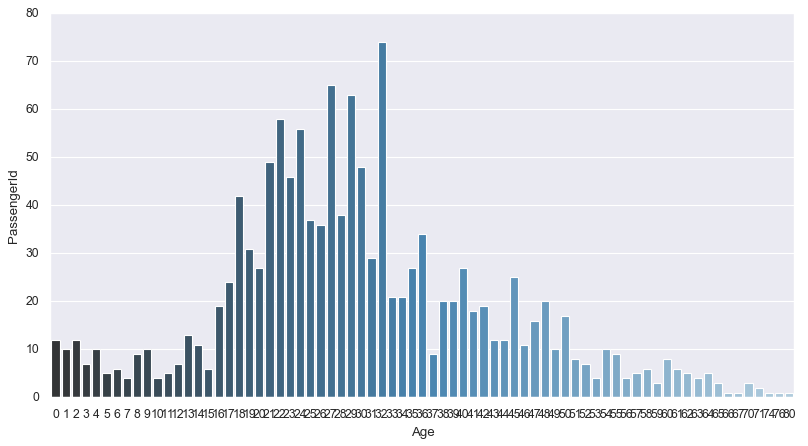

In [273]:
# your code here
fig, ax = plt.subplots(figsize=(12,6))

ax=sns.barplot(x=ages,y=ages_count, palette="Blues_d")
sns.set()
plt.xlabel('Age')

#### Use subplots and plot the distribution of the `Age`  with bins equal to 10, 20 and 50.

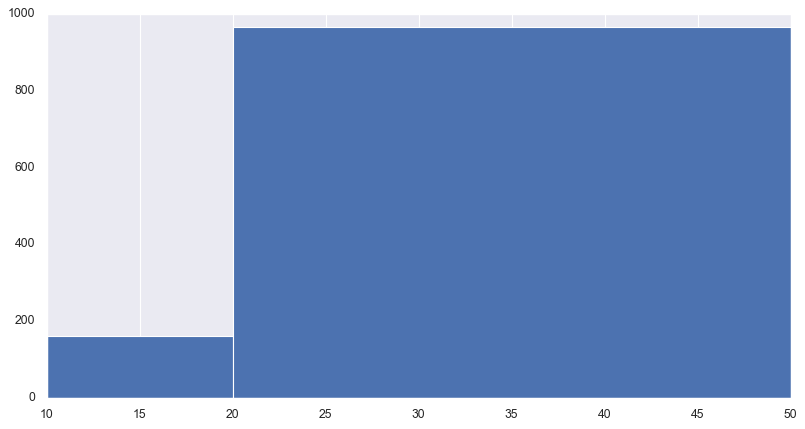

In [301]:
fig, ax=plt.subplots(figsize=(12,6))
plt.hist(titanic['Age'],bins=[10,20,50],histtype='bar')
plt.grid(axis='y')

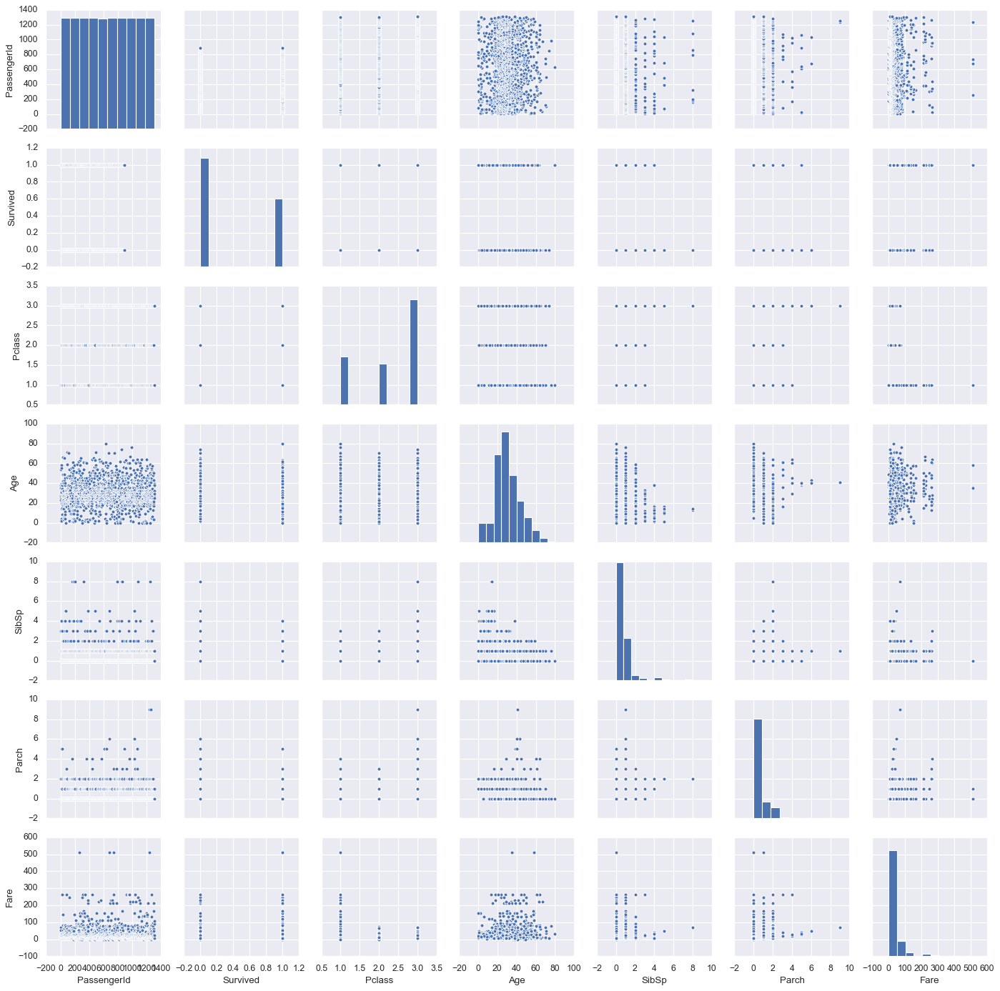

In [298]:
sns.pairplot(titanic, kind="scatter")
plt.show()

Text(0.5, 0, 'Age')

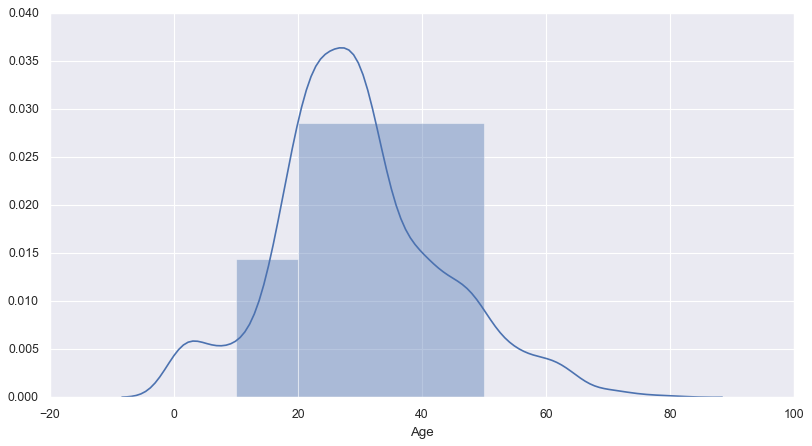

In [300]:
# your code here
fig, ax=plt.subplots(figsize=(12,6))
ax=sns.distplot(titanic['Age'],bins=[10,20,50])

plt.xlabel('Age')

#### How does the bin size affect your plot?

In [ ]:
"""
it does show most of the data gathered together. so it does not give you much conclussion.
"""

#### Use seaborn to show the distribution of column `Age`.

Text(0, 0.5, 'Number')

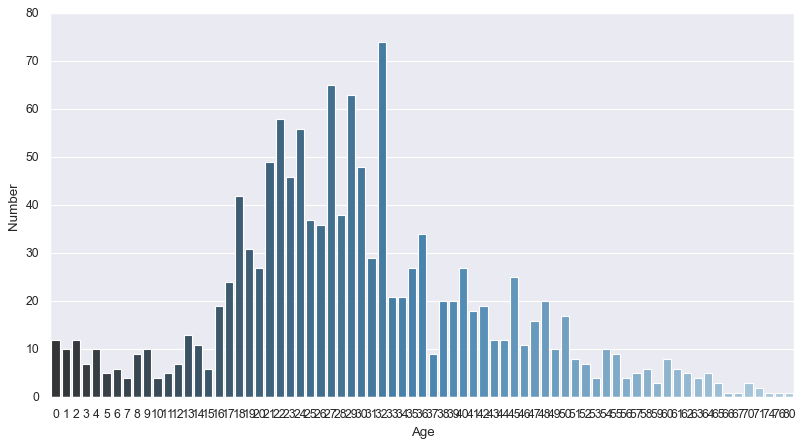

In [317]:
# your code here
fig, ax = plt.subplots(figsize=(12,6))

ax=sns.barplot(x=ages,y=ages_count, palette="Blues_d")
sns.set()
plt.xlabel('Age')
plt.ylabel('Number')

#### Use the right plot to visualize column `Gender`. There are 2 ways of doing it. Do it both ways.
**Hint**: Use matplotlib and seaborn.

In [313]:
gender_count=titanic.groupby('Gender')['PassengerId'].count()
gender=titanic['Gender'].sort_values().unique()
gender_count

Gender
female    466
male      843
Name: PassengerId, dtype: int64

<BarContainer object of 2 artists>

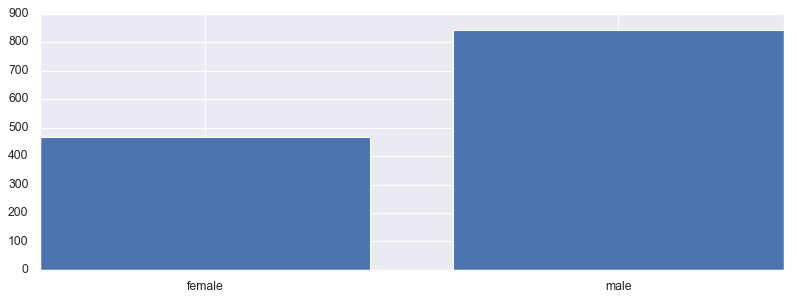

In [314]:
# Method 1 - matplotlib
# your code here
fig, ax=plt.subplots(figsize=(12,4))
plt.bar(gender,gender_count)

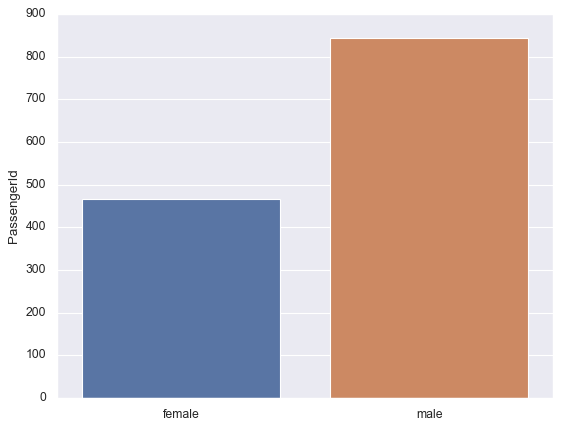

In [354]:
# Method 2 - seaborn
# your code here
ax=sns.barplot(x=gender,y=gender_count)


#### Use the right plot to visualize the column `Pclass`.

In [337]:
pclass=titanic['Pclass'].sort_values().unique()
pclass_count=titanic.groupby('Pclass').agg({'PassengerId':'count'})


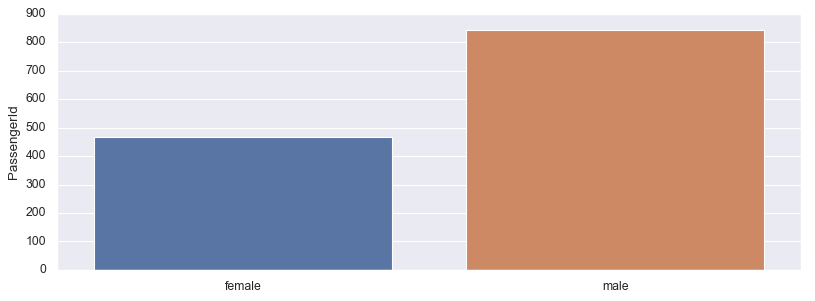

In [338]:
# your code here
fig, ax, =plt.subplots(figsize=(12,4))
ax=sns.barplot(x=pclass,y=pclass_count)


#### We would like to have in one single plot the summary statistics of the feature `Age`. What kind of plot would you use? Plot it. 

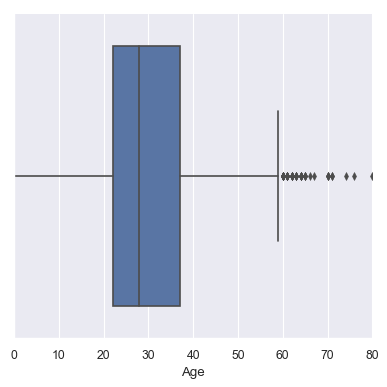

In [355]:
sns.catplot(x= 'Age',kind='box', data=titanic)

#### What does the last plot tell you about the feature `Age`?

In [356]:
"""
Age starts at 0, 1st quartile around 22, mean around 28 and 3rd quartile 38. Outliners are shown above 60"""

'\nAge starts at 0, 1st quartile around 22, mean around 28 and 3rd quartile 38. Outliners are shown above 60'

#### Now in addition to the summary statistics, we want to have in the same plot the distribution of `Age`. What kind of plot would you use? Plot it. 

<BarContainer object of 73 artists>

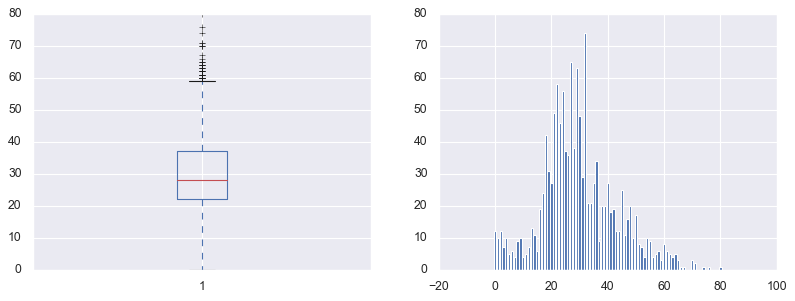

In [388]:
# your code here
fig, (ax1,ax2) =plt.subplots(1,2,figsize=(12,4))
ax1.boxplot(titanic['Age'])
ax2.bar(ages,ages_count)


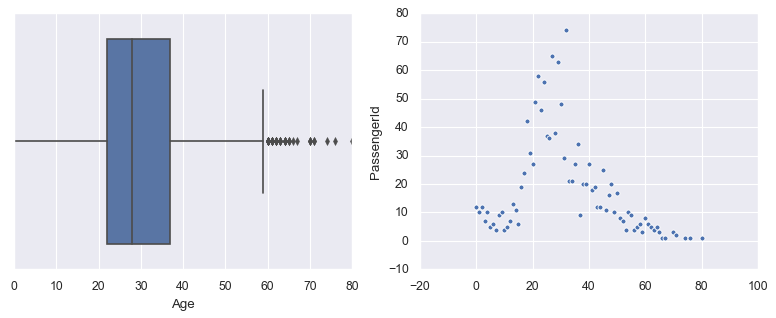

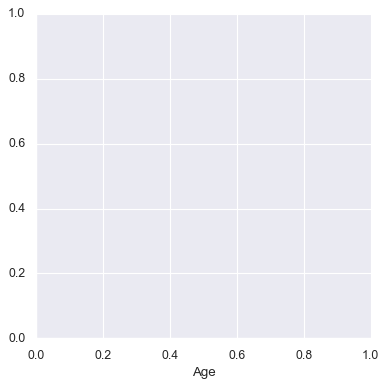

In [395]:
fig, ax =plt.subplots(1,2,figsize=(12,4))
sns.catplot(x= 'Age',kind='box', data=titanic, ax=ax[0])
sns.scatterplot(x= ages,y=ages_count,data=titanic, ax=ax[1])


#### What additional information does the last plot provide about feature `Age`?

In [ ]:
"""
your comments here
"""

#### We suspect that there is a linear relationship between `Fare` and `Age`. Use the right plot to show the relationship between these 2 features. There are 2 ways, please do it both ways.
**Hint**: Use matplotlib and seaborn.

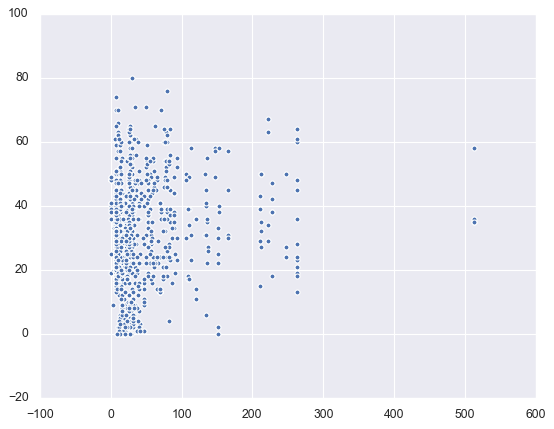

In [397]:
# Method 1 - matplotlib
# your code here
plt.scatter(titanic['Fare'],titanic['Age'])


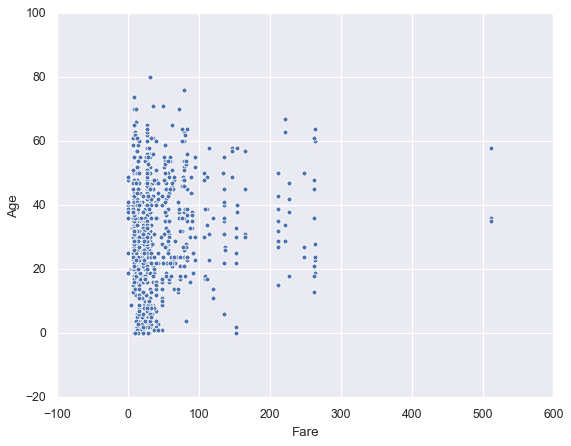

In [396]:
# Method 2 - seaborn
# your code here
sns.scatterplot(x= 'Fare',y='Age',data=titanic)


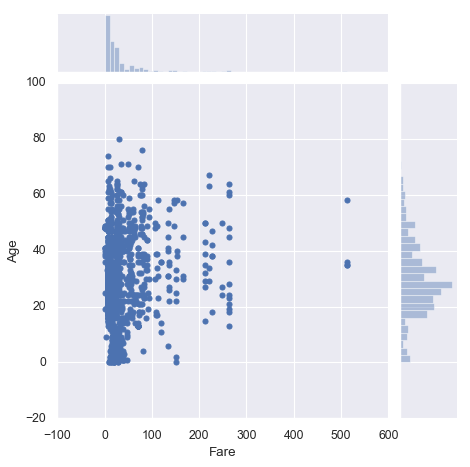

In [410]:
sns.jointplot(x= 'Fare',y='Age',data=titanic)


#### Plot the correlation matrix using seaborn.

In [400]:
# your code here
tcorr=titanic.corr()

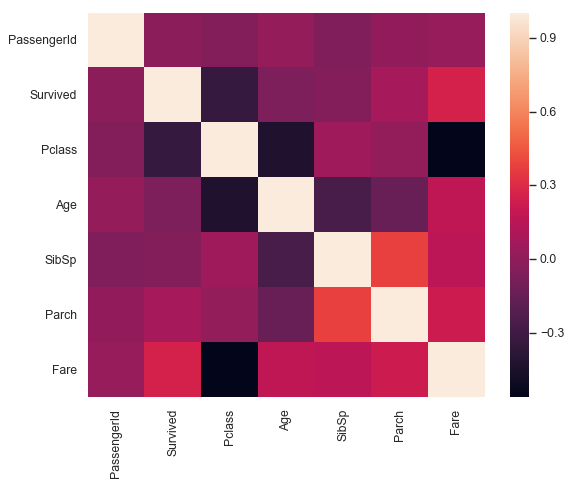

In [404]:
sns.heatmap(titanic.corr(),xticklabels=titanic.corr().columns,yticklabels=titanic.corr().columns)

#### What are the most correlated features?

In [ ]:
"""
your comments here
"""

#### Use the most appropriate plot to display the summary statistics of `Age` depending on `Pclass`.

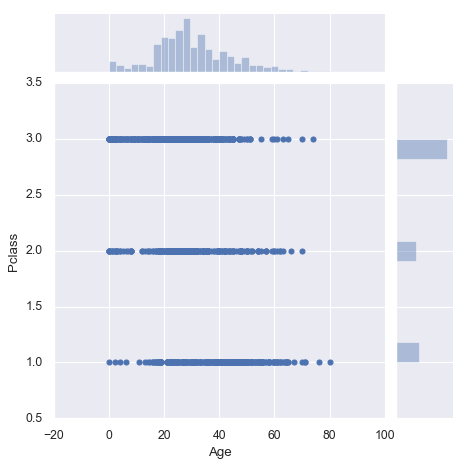

In [417]:
# your code here
sns.jointplot('Age','Pclass',data=titanic)

#### Use seaborn to plot the distribution of `Age` based on the `Gender`.
**Hint**: Use Facetgrid.

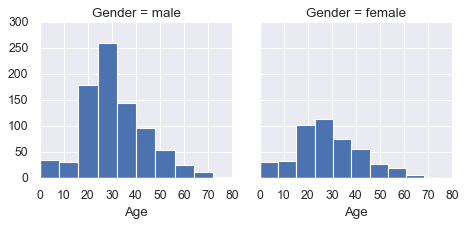

In [419]:
# your code here
g=sns.FacetGrid(titanic, col="Gender")
g=g.map(plt.hist,"Age")